EDA CLIMATE + ERA5

In [39]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)
pd.set_option('display.max_colwidth', None)

climate_path = "D:/dataset/natural/climate/terraclimate_mekong_delta_2019_2024_full.csv"
climate = pd.read_csv(climate_path)
era5_path = "D:/dataset/natural/era5/era5_mekong_delta_2019_2024_full.csv"
era5 = pd.read_csv(era5_path)

print("Climate shape:", climate.shape)
print(climate.head())
print("ERA5 shape:", era5.shape)
print(era5.head())
print(f"Số tỉnh trong climate: {climate['province'].nunique()}")
print(f"Số tỉnh trong era5: {era5['province'].nunique()}")

Climate shape: (936, 16)
    province     date          aet          def      pdsi          pet          pr        ro         soil        srad  swe       tmmn       tmmx        vap       vpd        vs
0  Soc Trang  2019-01   831.807733   416.877886  2.199813  1248.685618   27.342697  1.450093  1506.560534  184.205915  0.0  24.239529  31.090482  27.448265  1.045621  3.170618
1  Soc Trang  2019-02   576.498879   659.882873  2.601050  1236.381752    0.239447  0.000000   932.963336  218.933719  0.0  24.439559  31.252873  26.868660  1.143835  2.269240
2  Soc Trang  2019-03   351.339839  1065.374654  2.231526  1416.714494    5.381360  0.000000   632.058891  232.650058  0.0  25.642975  32.451756  28.315918  1.274536  1.555077
3  Soc Trang  2019-04   347.554725  1166.472002  1.156982  1514.026728   21.207172  1.035880   485.611935  243.659873  0.0  26.980521  33.982903  29.938434  1.469134  1.841705
4  Soc Trang  2019-05  1419.955006    65.487766  0.556808  1485.442772  152.532443  7.649682   

Chuyển date thành datetime

In [40]:
climate['date'] = pd.to_datetime(climate['date'])
era5['date'] = pd.to_datetime(era5['date'])
print(climate.dtypes)
print(era5.dtypes)

province            object
date        datetime64[ns]
aet                float64
def                float64
pdsi               float64
pet                float64
pr                 float64
ro                 float64
soil               float64
srad               float64
swe                float64
tmmn               float64
tmmx               float64
vap                float64
vpd                float64
vs                 float64
dtype: object
province                                                             object
date                                                         datetime64[ns]
dewpoint_temperature_2m                                             float64
dewpoint_temperature_2m_max                                         float64
dewpoint_temperature_2m_min                                         float64
evaporation_from_bare_soil_max                                      float64
evaporation_from_bare_soil_min                                      float64
evaporation_from_bare_

In [41]:
# Thống kê nhanh
print(climate.info())
print(climate.describe())

print(era5.info())
print(era5.describe())

# Kiểm tra null
num_null_cols = climate.isna().any().sum()
print(f"Số cột có null trong climate: {num_null_cols}")
num_null_cols = era5.isna().any().sum()
print(f"Số cột có null trong era5: {num_null_cols}")


# Kiểm tra trùng lặp
print(f"Số dòng trùng lặp trong climate: {climate.duplicated().sum()}")
print(f"Số dòng trùng lặp trong era5: {era5.duplicated().sum()}")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 936 entries, 0 to 935
Data columns (total 16 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   province  936 non-null    object        
 1   date      936 non-null    datetime64[ns]
 2   aet       936 non-null    float64       
 3   def       936 non-null    float64       
 4   pdsi      936 non-null    float64       
 5   pet       936 non-null    float64       
 6   pr        936 non-null    float64       
 7   ro        936 non-null    float64       
 8   soil      936 non-null    float64       
 9   srad      936 non-null    float64       
 10  swe       936 non-null    float64       
 11  tmmn      936 non-null    float64       
 12  tmmx      936 non-null    float64       
 13  vap       936 non-null    float64       
 14  vpd       936 non-null    float64       
 15  vs        936 non-null    float64       
dtypes: datetime64[ns](1), float64(14), object(1)
memory usage: 117

Nhận xét: Dataset sạch và đầy đủ cho 13 tỉnh

Correlation Matrix

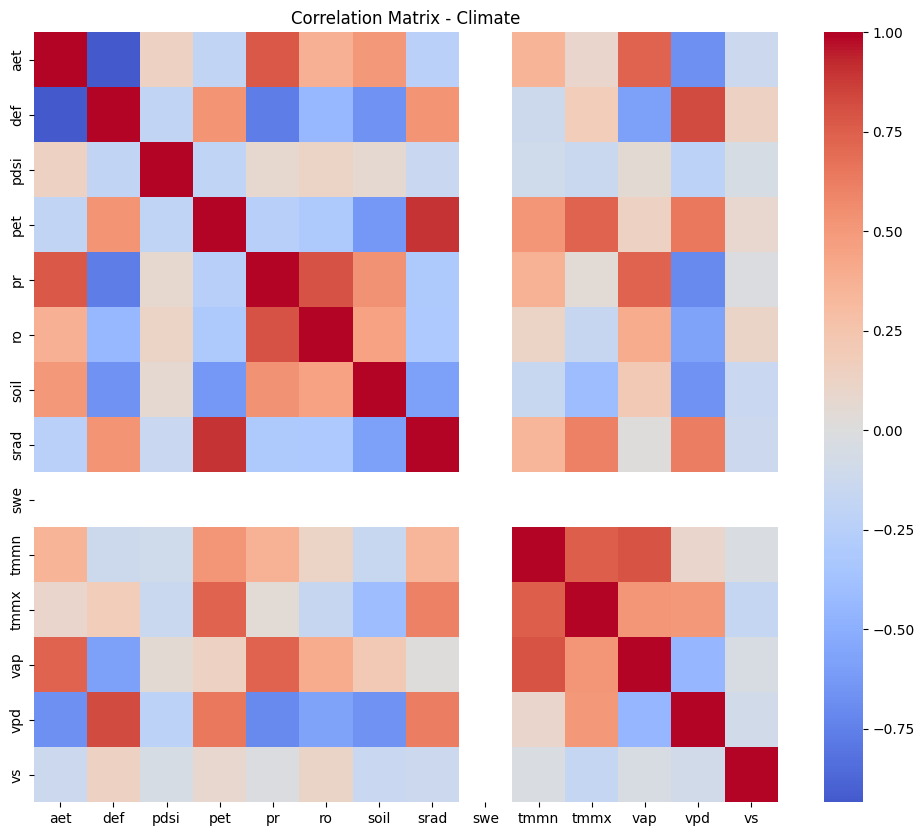

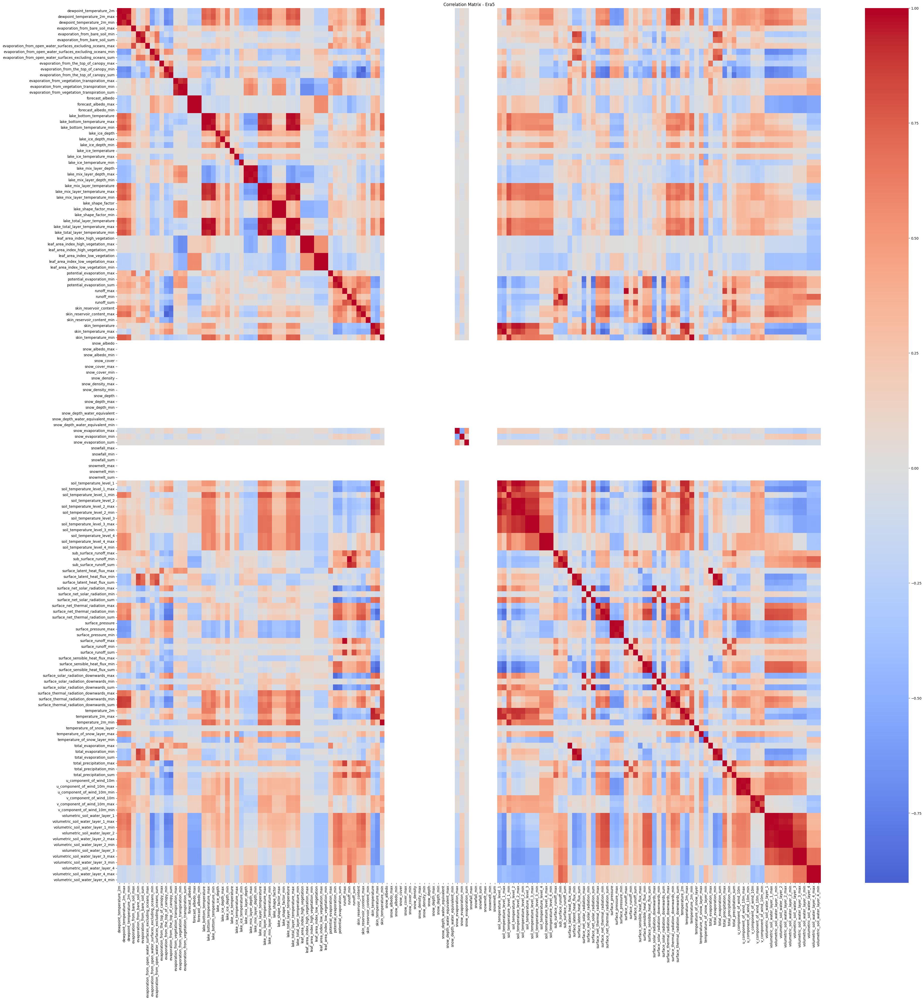

In [42]:
# Chỉ lấy các cột số
climate_num = climate.select_dtypes(include=['float64', 'int64'])
era5_num = era5.select_dtypes(include=['float64', 'int64'])

plt.figure(figsize=(12,10))
sns.heatmap(climate_num.corr(), cmap="coolwarm", center=0)
plt.title("Correlation Matrix - Climate")
plt.show()

plt.figure(figsize=(45,45))
sns.heatmap(era5_num.corr(), cmap="coolwarm", center=0)
plt.title("Correlation Matrix - Era5")
plt.show()


Các cặp feature có correlation > 0.9 trong Climate

In [43]:
# Chọn các cột số để tính correlation
numeric_cols = climate.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Tính ma trận correlation tuyệt đối
corr_matrix = climate[numeric_cols].corr().abs()

# Tạo mask cho upper triangle
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Lấy các cặp có correlation > 0.9
strong_corr_pairs = [(col1, col2, upper.loc[col1, col2]) 
                     for col1 in upper.columns 
                     for col2 in upper.index 
                     if pd.notna(upper.loc[col1, col2]) and upper.loc[col1, col2] > 0.9]

# Chuyển thành DataFrame để dễ nhìn
strong_corr_df = pd.DataFrame(strong_corr_pairs, columns=['Feature 1', 'Feature 2', 'Correlation']).sort_values(by='Correlation', ascending=False)

print("Các cặp cột có correlation > 0.9:")
print(strong_corr_df)

Các cặp cột có correlation > 0.9:
  Feature 1 Feature 2  Correlation
0       aet       def     0.934659


Các cặp feature có correlation > 0.9 trong ERA5

In [44]:
# Chọn các cột số để tính correlation
numeric_cols = era5.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Tính ma trận correlation tuyệt đối
corr_matrix = era5[numeric_cols].corr().abs()

# Tạo mask cho upper triangle
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Lấy các cặp có correlation > 0.9
strong_corr_pairs = [(col1, col2, upper.loc[col1, col2]) 
                     for col1 in upper.columns 
                     for col2 in upper.index 
                     if pd.notna(upper.loc[col1, col2]) and upper.loc[col1, col2] > 0.9]

# Chuyển thành DataFrame để dễ nhìn
strong_corr_df = pd.DataFrame(strong_corr_pairs, columns=['Feature 1', 'Feature 2', 'Correlation']).sort_values(by='Correlation', ascending=False)

print("Các cặp cột có correlation > 0.9:")
print(strong_corr_df)


Các cặp cột có correlation > 0.9:
                                         Feature 1                                      Feature 2  Correlation
105                   surface_latent_heat_flux_sum                          total_evaporation_sum     1.000000
102                   surface_latent_heat_flux_min                          total_evaporation_min     1.000000
100                   surface_latent_heat_flux_max                          total_evaporation_max     1.000000
48                 leaf_area_index_high_vegetation            leaf_area_index_high_vegetation_max     1.000000
49                 leaf_area_index_high_vegetation            leaf_area_index_high_vegetation_min     1.000000
50             leaf_area_index_high_vegetation_max            leaf_area_index_high_vegetation_min     1.000000
97                        soil_temperature_level_4                   soil_temperature_level_4_min     0.999981
96                        soil_temperature_level_4                   soil_temp

Nhận xét: 
- 3 cặp đầu tiên có corr = 1.0
- Bộ 3 leaf_area_index_high_vegetation/_min/_max cũng có corr với nhau là 1.0
- Nhiều bộ 3 feature có tên dạng X(_sum)/X_min/X_max có corr với nhau cũng rất cao

Scatter plot cho Climate và ERA5

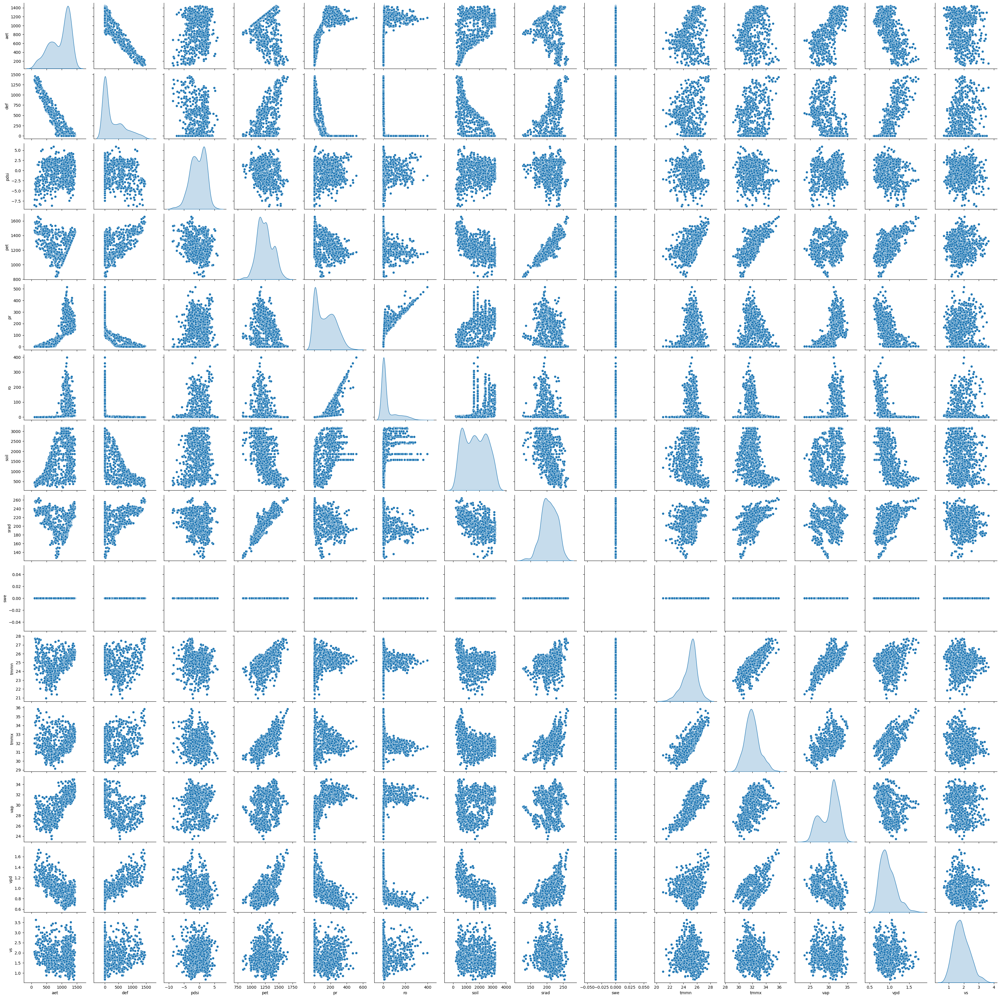

In [45]:
# Climate
sns.pairplot(climate.select_dtypes(include=['float64', 'int64']), diag_kind='kde')
plt.show()


In [46]:
# # Era5
# sns.pairplot(era5.select_dtypes(include=['float64', 'int64']), diag_kind='kde')
# plt.show()

Variance Inflation Factor để đánh giá tính đa cộng tuyến của các features cho Climate và ERA5

In [47]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calculate_vif(df, threshold=5):
    # Lọc các cột numeric
    numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
    X = df[numeric_cols]
    
    # Tính VIF
    vif_data = pd.DataFrame()
    vif_data['feature'] = X.columns
    vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    
    # Sort giảm dần
    vif_data = vif_data.sort_values(by='VIF', ascending=False).reset_index(drop=True)
    
    # Highlight cột VIF > threshold
    vif_data['high_multicollinearity'] = vif_data['VIF'] > threshold
    
    return vif_data

# VIF cho climate
vif_climate = calculate_vif(climate)
print("VIF climate:")
print(vif_climate)

# VIF cho era5
vif_era5 = calculate_vif(era5)
print("VIF era5:")
print(vif_era5)


VIF climate:
   feature           VIF  high_multicollinearity
0      pet  1.908956e+09                    True
1      aet  1.227728e+09                    True
2      def  2.905813e+08                    True
3     tmmn  3.408604e+03                    True
4     tmmx  3.274988e+03                    True
5      vap  3.120443e+03                    True
6     srad  6.825353e+02                    True
7      vpd  3.871613e+02                    True
8       pr  3.095923e+01                    True
9       vs  2.653513e+01                    True
10    soil  1.296961e+01                    True
11      ro  7.441864e+00                    True
12    pdsi  1.192085e+00                   False
13     swe           NaN                   False
VIF era5:
                                                       feature           VIF  high_multicollinearity
0                                        total_evaporation_sum  9.353270e+12                    True
1                                       

PHÂN TÍCH ĐƠN BIẾN

Climate

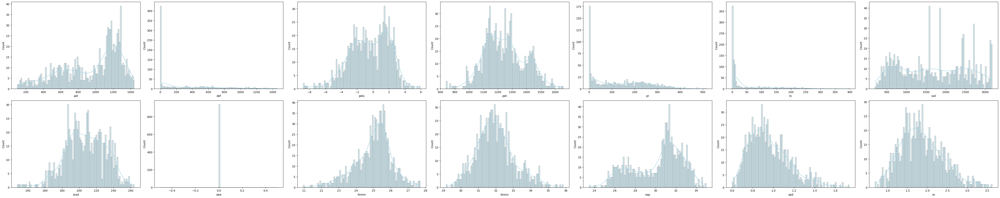

In [48]:
import math
num_cols = len(climate.select_dtypes('float64', 'int64').columns)
cols = 7
rows = math.ceil(num_cols / cols)

fig, axes = plt.subplots(rows, cols, figsize=(50, 10))
axes = axes.flatten()

for i, col in enumerate(climate.select_dtypes('float64', 'int64').columns):
    sns.histplot(climate[col], bins=100, kde=True, ax=axes[i], color='lightblue', edgecolor='black')

plt.tight_layout()
plt.show()

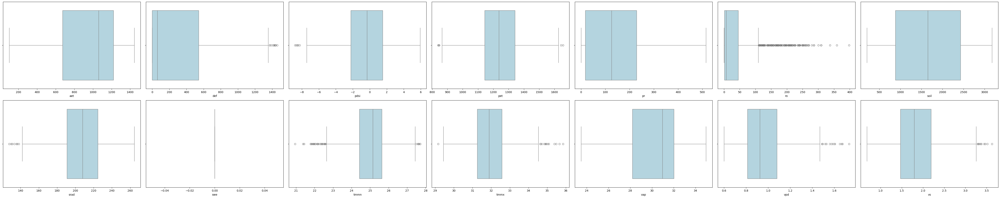

In [49]:
num_cols = len(climate.select_dtypes('float64', 'int64').columns)
cols = 7
rows = math.ceil(num_cols / cols)

fig, axes = plt.subplots(rows, cols, figsize=(50, 10))
axes = axes.flatten()

for i, col in enumerate(climate.select_dtypes('float64', 'int64').columns):
    sns.boxplot(x=climate[col], ax=axes[i], color='lightblue')

plt.tight_layout()
plt.show()

ERA5

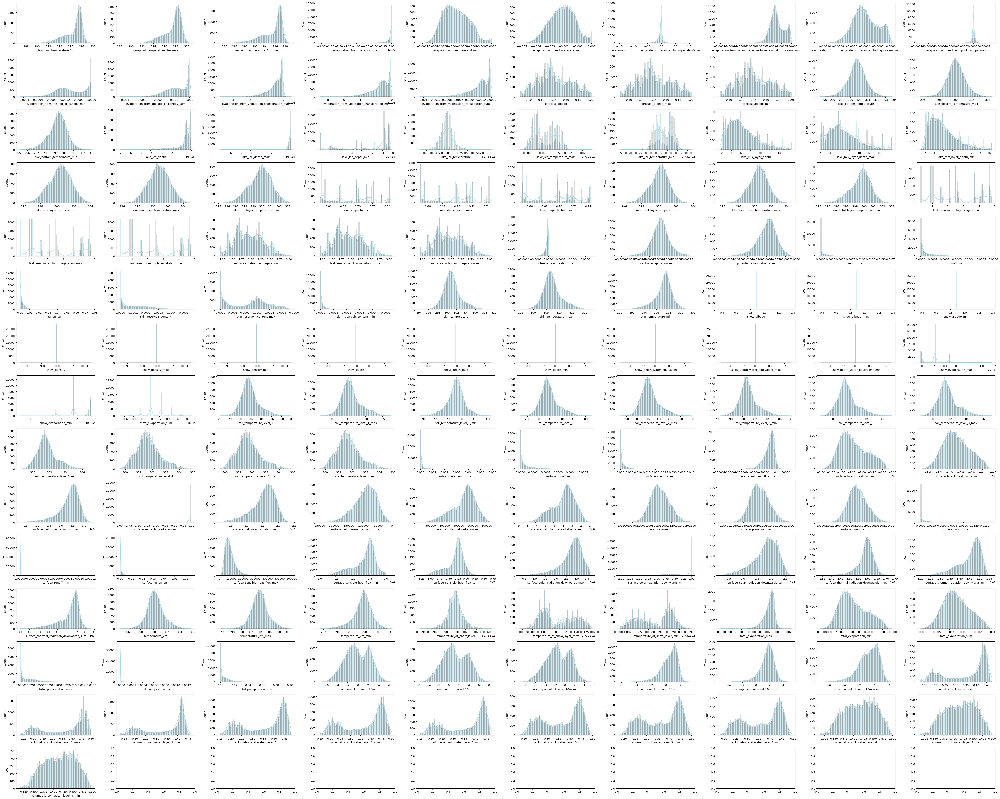

In [50]:
num_cols = len(era5.select_dtypes('float64', 'int64').columns)
cols = 10
rows = math.ceil(num_cols / cols)

fig, axes = plt.subplots(rows, cols, figsize=(50, 40))
axes = axes.flatten()

for i, col in enumerate(era5.select_dtypes('float64', 'int64').columns):
    sns.histplot(era5[col], bins=100, kde=True, ax=axes[i], color='lightblue', edgecolor='black')

plt.tight_layout()
plt.show()


In [51]:
num_cols = len(era5.select_dtypes('float64', 'int64').columns)
cols = 3
rows = math.ceil(num_cols / cols)

fig, axes = plt.subplots(rows, cols, figsize=(120, 80))
axes = axes.flatten()

for i, col in enumerate(era5.select_dtypes('float64', 'int64').columns):
    sns.boxplot(x=era5[col], ax=axes[i], color='lightblue')

plt.tight_layout()
plt.show()


Lượng mưa trung bình theo theo tháng từng tỉnh và Đồng bằng sông Cửu Long

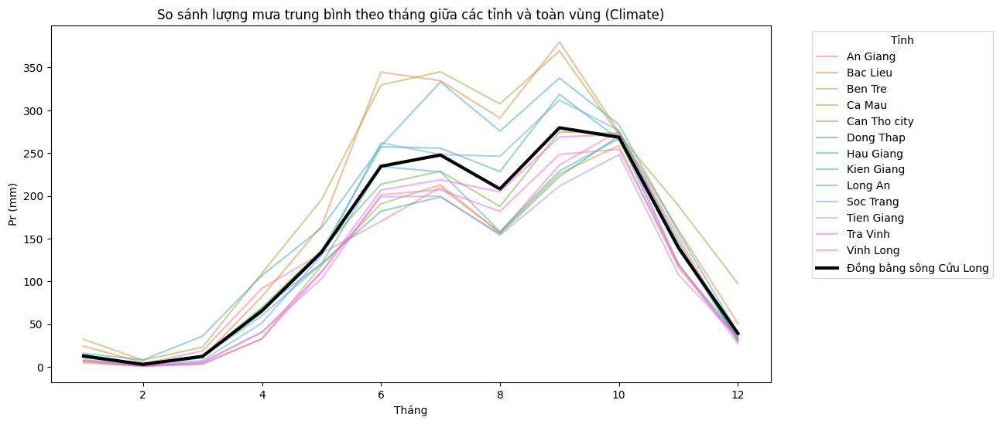

In [52]:
# Thêm cột tháng
climate['month'] = climate['date'].dt.month

# Trung bình từng tỉnh theo tháng
monthly_pr = climate.groupby(['province', 'month'])['pr'].mean().reset_index()

# Trung bình toàn vùng theo tháng
avg_monthly = climate.groupby('month')['pr'].mean().reset_index(name='avg_pr')

# Vẽ biểu đồ
plt.figure(figsize=(12,6))

# Đường từng tỉnh
sns.lineplot(data=monthly_pr, x='month', y='pr', hue='province', alpha=0.5)

# Đường trung bình toàn vùng
sns.lineplot(data=avg_monthly, x='month', y='avg_pr', color='black', linewidth=3, label='Đồng bằng sông Cửu Long')

plt.title("So sánh lượng mưa trung bình theo tháng giữa các tỉnh và toàn vùng (Climate)")
plt.ylabel("Pr (mm)")
plt.xlabel("Tháng")
plt.legend(title="Tỉnh", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


Lượng mưa trung bình theo theo năm từng tỉnh và Đồng bằng sông Cửu Long

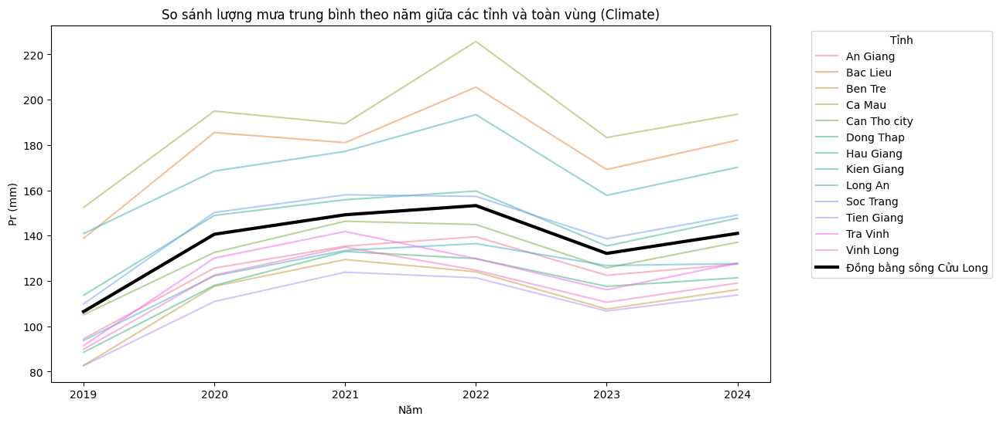

In [53]:
# Thêm cột năm
climate['year'] = climate['date'].dt.year

# Trung bình từng tỉnh theo năm
yearly_pr = climate.groupby(['province', 'year'])['pr'].mean().reset_index()

# Trung bình toàn vùng theo năm
avg_yearly = climate.groupby('year')['pr'].mean().reset_index(name='avg_pr')

# Vẽ biểu đồ
plt.figure(figsize=(12,6))

# Đường từng tỉnh
sns.lineplot(data=yearly_pr, x='year', y='pr', hue='province', alpha=0.5)

# Đường trung bình vùng
sns.lineplot(data=avg_yearly, x='year', y='avg_pr', color='black', linewidth=3, label='Đồng bằng sông Cửu Long')

plt.title("So sánh lượng mưa trung bình theo năm giữa các tỉnh và toàn vùng (Climate)")
plt.ylabel("Pr (mm)")
plt.xlabel("Năm")
plt.legend(title="Tỉnh", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


Tôi bí quá